In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torchvision.models import resnet50
from PIL import Image
import json
import requests
from io import BytesIO
import os

# Konfiguracja wizualizacji
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

print("Importy zakończone. PyTorch gotowy.")

In [2]:
# Prosty Moduł do normalizacji obrazu (średnia i odchylenie standardowe ImageNet)
class Normalize(nn.Module):
    def __init__(self, mean, std):
        super(Normalize, self).__init__()
        self.mean = torch.Tensor(mean)
        self.std = torch.Tensor(std)
    def forward(self, x):
        return (x - self.mean.type_as(x)[None,:,None,None]) / self.std.type_as(x)[None,:,None,None]

# Standardowe wartości normalizacji dla ImageNet
norm = Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

# Ładowanie wstępnie wytrenowanego ResNet50
print("Ładowanie modelu ResNet50...")
model = resnet50(pretrained=True)
# Ustawienie modelu w tryb ewaluacji (wyłączenie np. Batch Normalization i Dropout)
model.eval()

# Wczytanie etykiet klas ImageNet
with open("imagenet_class_index.json") as f:
    imagenet_classes = {int(i):x[1] for i,x in json.load(f).items()}

# Preprocessing: Skalowanie do 224x224 i konwersja na Tensor
preprocess = transforms.Compose([
   transforms.Resize((224, 224)),
   transforms.ToTensor(), # konwersja na Tensor CHW
])

print("Model i etykiety załadowane pomyślnie.")

Ładowanie modelu ResNet50...


C:\Users\Damian\Documents\GitHub\Engieering Thesis\Adversarial_Attacks\.venv\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Damian\Documents\GitHub\Engieering Thesis\Adversarial_Attacks\.venv\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Model i etykiety załadowane pomyślnie.


In [3]:
# Lista scenariuszy: Plik | Prawdziwy Indeks | Cel Ataku (Indeks) | Nazwa Celu
scenarios = [
    {"file": "banana.jpg",        "true_idx": 954, "target_idx": 951, "target_name": "lemon"},
    {"file": "lemon.jpg",         "true_idx": 951, "target_idx": 954, "target_name": "banana"},
    {"file": "samoyed.jpg",       "true_idx": 258, "target_idx": 388, "target_name": "giant_panda"},
    {"file": "traffic_light.jpg", "true_idx": 920, "target_idx": 971, "target_name": "bubble"},
    {"file": "stop_sign.jpg",     "true_idx": 919, "target_idx": 920, "target_name": "traffic_light"},
    {"file": "panda.jpg",         "true_idx": 388, "target_idx": 291, "target_name": "lion"},
    {"file": "toaster.jpg",       "true_idx": 859, "target_idx": 283, "target_name": "persian_cat"},
    {"file": "airliner.jpg",      "true_idx": 404, "target_idx": 895, "target_name": "warplane"},
    {"file": "fire_engine.jpg",   "true_idx": 555, "target_idx": 817, "target_name": "sports_car"},
    {"file": "pig.jpg",           "true_idx": 341, "target_idx": 404, "target_name": "airliner"}
]


PRZETWARZANIE OBRAZU: banana.jpg
Cel: Zmiana 'banana' -> 'lemon'


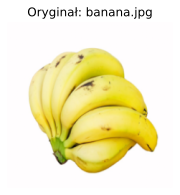

Predykcja modelu dla czystego obrazu: banana
Początkowa strata (CrossEntropy): 0.0911

>>> Atak Niekierowany (30 iteracji)...
   Wynik ataku niekierowanego: coral_fungus

>>> Atak Ukierunkowany na 'lemon' (100 iteracji)...
   Końcowa klasa: lemon (100.00%)
   Czy atak udany? TAK ✅


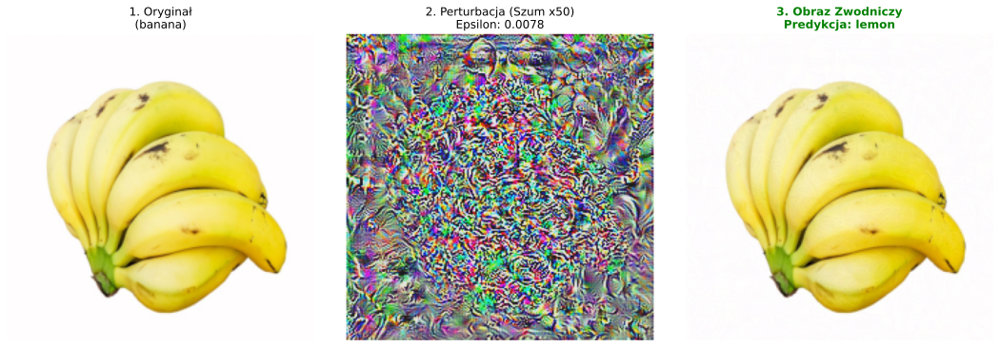


PRZETWARZANIE OBRAZU: lemon.jpg
Cel: Zmiana 'lemon' -> 'banana'


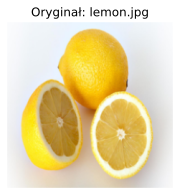

Predykcja modelu dla czystego obrazu: lemon
Początkowa strata (CrossEntropy): 0.0335

>>> Atak Niekierowany (30 iteracji)...
   Wynik ataku niekierowanego: orange

>>> Atak Ukierunkowany na 'banana' (100 iteracji)...
   Końcowa klasa: banana (100.00%)
   Czy atak udany? TAK ✅


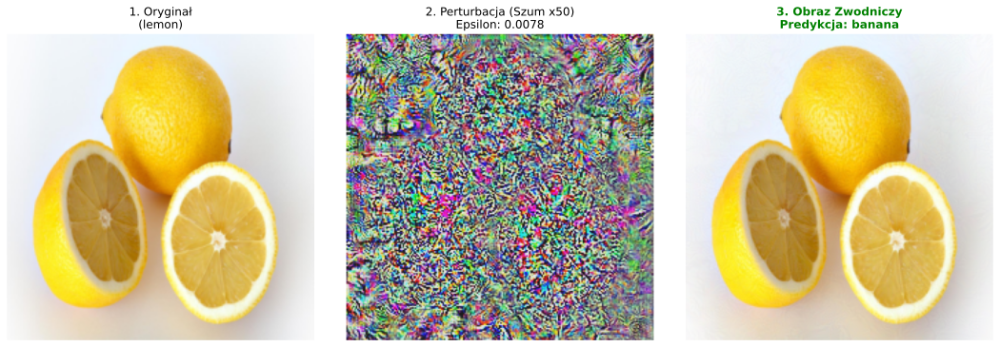


PRZETWARZANIE OBRAZU: samoyed.jpg
Cel: Zmiana 'Samoyed' -> 'giant_panda'


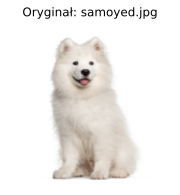

Predykcja modelu dla czystego obrazu: Samoyed
Początkowa strata (CrossEntropy): 0.0391

>>> Atak Niekierowany (30 iteracji)...
   Wynik ataku niekierowanego: Arctic_fox

>>> Atak Ukierunkowany na 'giant_panda' (100 iteracji)...
   Końcowa klasa: giant_panda (100.00%)
   Czy atak udany? TAK ✅


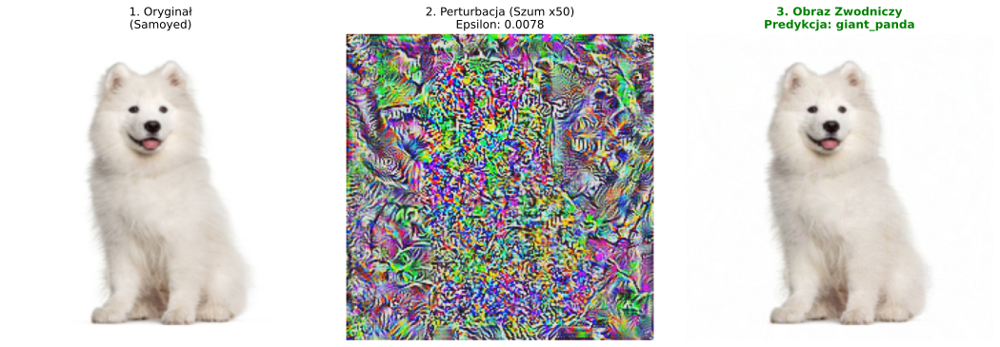


PRZETWARZANIE OBRAZU: traffic_light.jpg
Cel: Zmiana 'traffic_light' -> 'bubble'


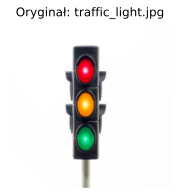

Predykcja modelu dla czystego obrazu: traffic_light
Początkowa strata (CrossEntropy): 0.0001

>>> Atak Niekierowany (30 iteracji)...
   Wynik ataku niekierowanego: traffic_light

>>> Atak Ukierunkowany na 'bubble' (100 iteracji)...
   Końcowa klasa: bubble (100.00%)
   Czy atak udany? TAK ✅


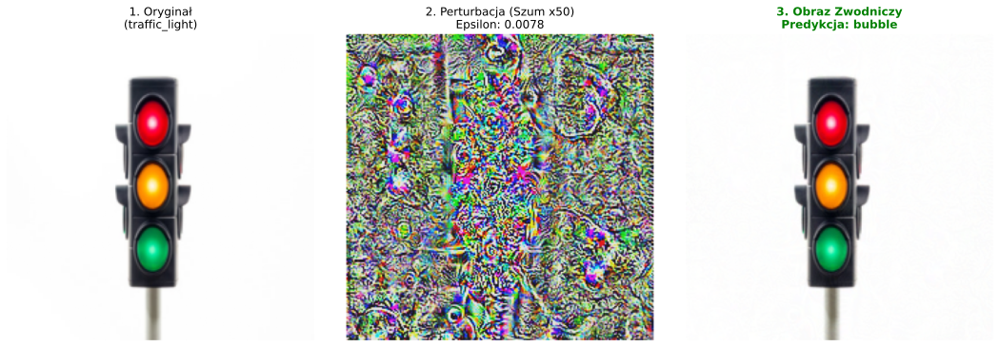


PRZETWARZANIE OBRAZU: stop_sign.jpg
Cel: Zmiana 'street_sign' -> 'traffic_light'


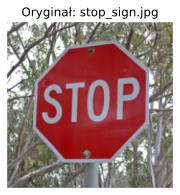

Predykcja modelu dla czystego obrazu: street_sign
Początkowa strata (CrossEntropy): 0.0157

>>> Atak Niekierowany (30 iteracji)...
   Wynik ataku niekierowanego: barn

>>> Atak Ukierunkowany na 'traffic_light' (100 iteracji)...
   Końcowa klasa: traffic_light (100.00%)
   Czy atak udany? TAK ✅


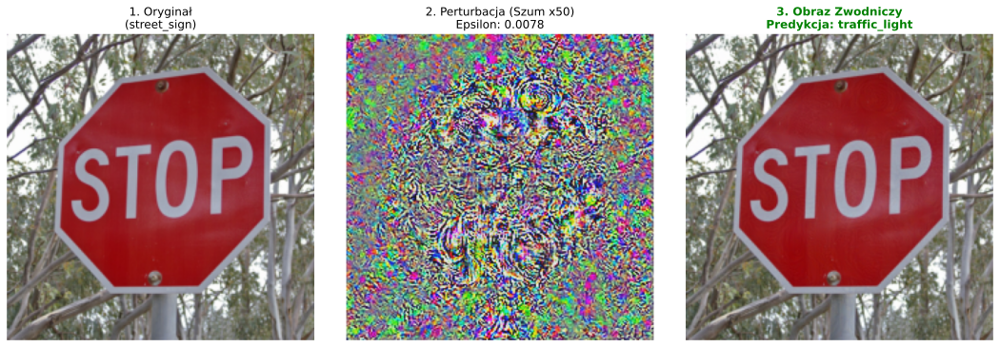


PRZETWARZANIE OBRAZU: panda.jpg
Cel: Zmiana 'giant_panda' -> 'lion'


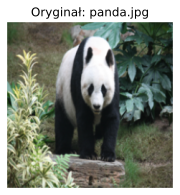

Predykcja modelu dla czystego obrazu: giant_panda
Początkowa strata (CrossEntropy): 0.0005

>>> Atak Niekierowany (30 iteracji)...
   Wynik ataku niekierowanego: giant_panda

>>> Atak Ukierunkowany na 'lion' (100 iteracji)...
   Końcowa klasa: lion (100.00%)
   Czy atak udany? TAK ✅


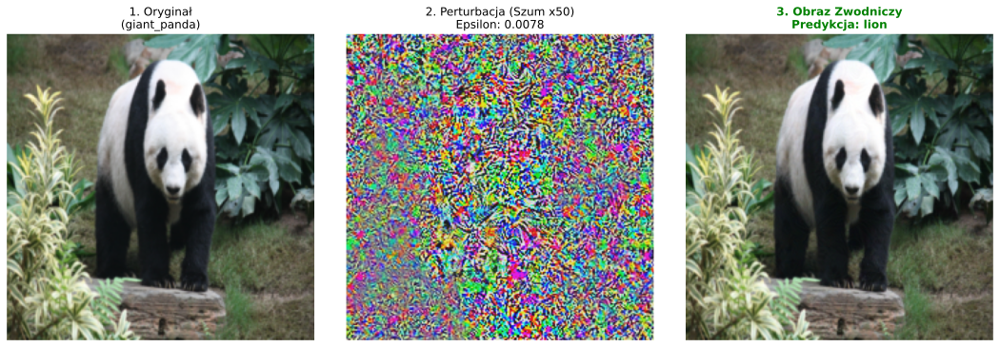


PRZETWARZANIE OBRAZU: toaster.jpg
Cel: Zmiana 'toaster' -> 'persian_cat'


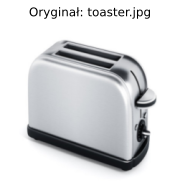

Predykcja modelu dla czystego obrazu: toaster
Początkowa strata (CrossEntropy): 0.0000

>>> Atak Niekierowany (30 iteracji)...
   Wynik ataku niekierowanego: toaster

>>> Atak Ukierunkowany na 'persian_cat' (100 iteracji)...
   Końcowa klasa: Persian_cat (99.63%)
   Czy atak udany? TAK ✅


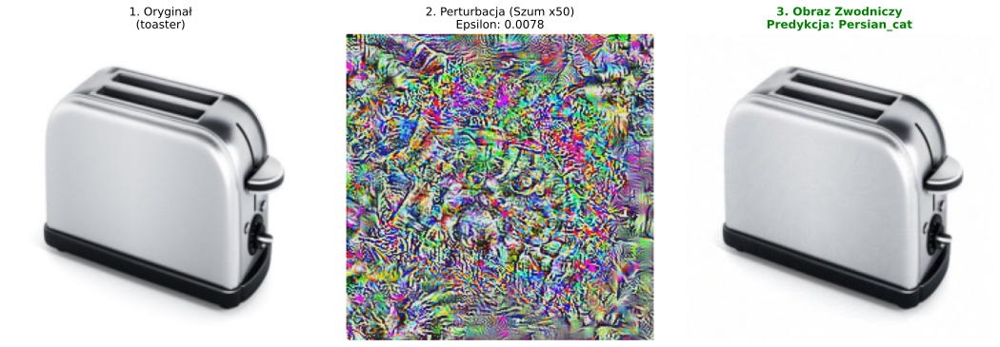


PRZETWARZANIE OBRAZU: airliner.jpg
Cel: Zmiana 'airliner' -> 'warplane'


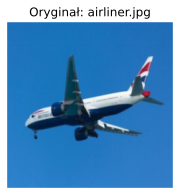

Predykcja modelu dla czystego obrazu: airliner
Początkowa strata (CrossEntropy): 0.0411

>>> Atak Niekierowany (30 iteracji)...
   Wynik ataku niekierowanego: warplane

>>> Atak Ukierunkowany na 'warplane' (100 iteracji)...
   Końcowa klasa: warplane (99.99%)
   Czy atak udany? TAK ✅


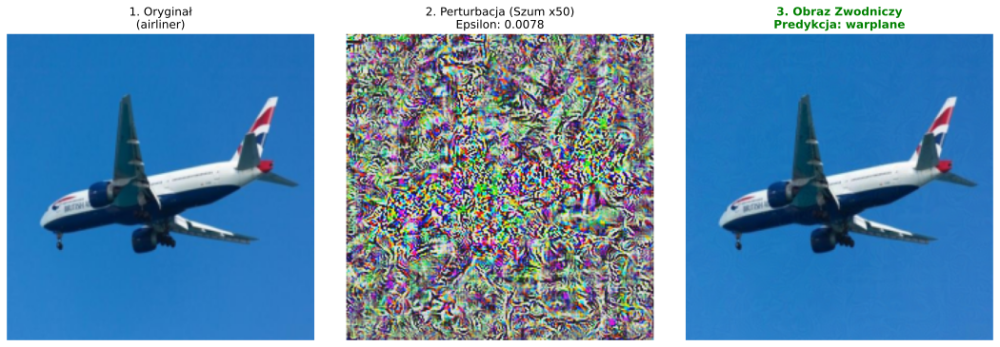


PRZETWARZANIE OBRAZU: fire_engine.jpg
Cel: Zmiana 'fire_engine' -> 'sports_car'


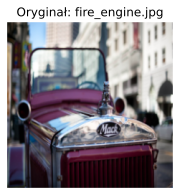

Predykcja modelu dla czystego obrazu: grille
Początkowa strata (CrossEntropy): 3.1812

>>> Atak Niekierowany (30 iteracji)...
   Wynik ataku niekierowanego: paintbrush

>>> Atak Ukierunkowany na 'sports_car' (100 iteracji)...
   Końcowa klasa: sports_car (99.86%)
   Czy atak udany? TAK ✅


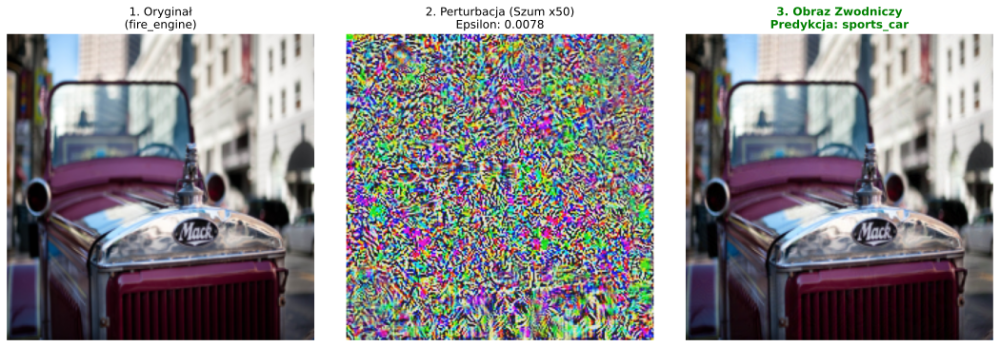


PRZETWARZANIE OBRAZU: pig.jpg
Cel: Zmiana 'hog' -> 'airliner'


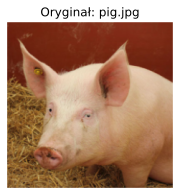

Predykcja modelu dla czystego obrazu: hog
Początkowa strata (CrossEntropy): 0.0039

>>> Atak Niekierowany (30 iteracji)...
   Wynik ataku niekierowanego: wombat

>>> Atak Ukierunkowany na 'airliner' (100 iteracji)...
   Końcowa klasa: airliner (91.27%)
   Czy atak udany? TAK ✅


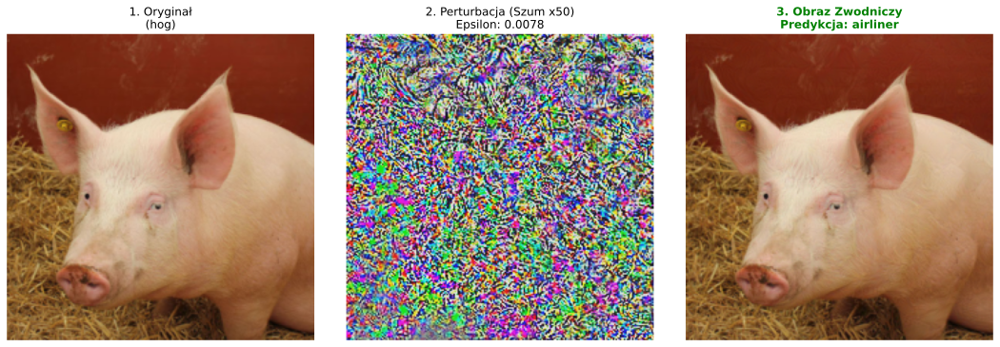

In [4]:
# Limit epsilon dla perturbacji L-inf: 2/255
epsilon = 2. / 255

for s in scenarios:
    filename = s["file"]
    true_idx = s["true_idx"]
    target_idx = s["target_idx"]
    target_name_str = s["target_name"]

    print(f"\n{'='*80}")
    print(f"PRZETWARZANIE OBRAZU: {filename}")
    print(f"Cel: Zmiana '{imagenet_classes[true_idx]}' -> '{target_name_str}'")
    print(f"{'='*80}")

    # --- 1. Wczytanie i Konwersja ---
    if not os.path.exists(filename):
        print(f"BŁĄD: Nie znaleziono pliku {filename}. Pomijam.")
        continue

    img_pil = Image.open(filename)
    # Dodajemy wymiar wsadowy: (1, C, H, W)
    img_tensor = preprocess(img_pil)[None,:,:,:]

    # Wyświetlenie oryginalnego obrazu (zgodnie z instrukcją)
    plt.figure(figsize=(3,3))
    plt.imshow(img_tensor[0].numpy().transpose(1,2,0))
    plt.title(f"Oryginał: {filename}")
    plt.axis('off')
    plt.show()

    # --- 2. Predykcja Bazowa ---
    pred = model(norm(img_tensor))
    initial_loss = nn.CrossEntropyLoss()(pred, torch.LongTensor([true_idx])).item()
    max_idx = pred.max(dim=1)[1].item()
    print(f"Predykcja modelu dla czystego obrazu: {imagenet_classes[max_idx]}")
    print(f"Początkowa strata (CrossEntropy): {initial_loss:.4f}")

    # --- 3. ATAK NIEKIEROWANY (Untargeted) ---
    print("\n>>> Atak Niekierowany (30 iteracji)...")
    delta = torch.zeros_like(img_tensor, requires_grad=True)
    opt = optim.SGD([delta], lr=1e-1)

    for t in range(30):
        pred = model(norm(img_tensor + delta))
        loss = -nn.CrossEntropyLoss()(pred, torch.LongTensor([true_idx]))
        opt.zero_grad()
        loss.backward()
        opt.step()
        delta.data.clamp_(-epsilon, epsilon)

    pred_u = model(norm(img_tensor + delta))
    max_u = pred_u.max(dim=1)[1].item()
    print(f"   Wynik ataku niekierowanego: {imagenet_classes[max_u]}")

    # --- 4. ATAK UKIERUNKOWANY (Targeted) ---
    print(f"\n>>> Atak Ukierunkowany na '{target_name_str}' (100 iteracji)...")
    delta = torch.zeros_like(img_tensor, requires_grad=True)
    opt = optim.SGD([delta], lr=5e-3) # Mniejszy learning rate

    for t in range(100):
        pred = model(norm(img_tensor + delta))
        # Funkcja straty: Max stratę prawdziwej klasy + Min stratę klasy docelowej
        loss = (-nn.CrossEntropyLoss()(pred, torch.LongTensor([true_idx])) +
                nn.CrossEntropyLoss()(pred, torch.LongTensor([target_idx])))

        opt.zero_grad()
        loss.backward()
        opt.step()
        delta.data.clamp_(-epsilon, epsilon)

    # Końcowa weryfikacja
    pred_adv = model(norm(img_tensor + delta))
    max_adv = pred_adv.max(dim=1)[1].item()
    prob_adv = nn.Softmax(dim=1)(pred_adv)[0, max_adv].item()
    success = (max_adv == target_idx)

    print(f"   Końcowa klasa: {imagenet_classes[max_adv]} ({prob_adv:.2%})")
    print(f"   Czy atak udany? {'TAK ✅' if success else 'NIE ❌'}")

    # --- 5. WIZUALIZACJA KOŃCOWA ---
    pig_adv_img = (img_tensor + delta)[0].detach().numpy().transpose(1, 2, 0)
    delta_viz = (50 * delta + 0.5)[0].detach().numpy().transpose(1, 2, 0) # Skalowanie szumu

    f, ax = plt.subplots(1, 3, figsize=(15, 5))

    # Oryginał
    ax[0].imshow(img_tensor[0].numpy().transpose(1, 2, 0))
    ax[0].set_title(f"1. Oryginał\n({imagenet_classes[true_idx]})")
    ax[0].axis('off')

    # Perturbacja
    ax[1].imshow(delta_viz.clip(0,1))
    ax[1].set_title(f"2. Perturbacja (Szum x50)\nEpsilon: {epsilon:.4f}")
    ax[1].axis('off')

    # Obraz Adwersarialny
    ax[2].imshow(pig_adv_img.clip(0,1))
    title_col = 'green' if success else 'red'
    ax[2].set_title(f"3. Obraz Zwodniczy\nPredykcja: {imagenet_classes[max_adv]}", color=title_col, fontweight='bold')
    ax[2].axis('off')

    plt.tight_layout()
    plt.show()

In [5]:
import pandas as pd

# Parametry globalne
epsilon = 2. / 255

# Lista do zbierania wyników
results_data = []

print(f"Rozpoczynam przetwarzanie {len(scenarios)} scenariuszy...\n")

for s in scenarios:
    filename = s["file"]
    true_idx = s["true_idx"]
    target_idx = s["target_idx"]
    target_name_str = s["target_name"]

    # 1. Wczytanie
    if not os.path.exists(filename):
        continue
    img_pil = Image.open(filename)
    img_tensor = preprocess(img_pil)[None,:,:,:]

    # 2. Stan Przed (Baseline)
    pred_base = model(norm(img_tensor))
    prob_base = nn.Softmax(dim=1)(pred_base)[0, true_idx].item()

    # Zapiszmy klasę, którą model widzi na początku (może być inna niż true_idx)
    base_class_idx = pred_base.max(dim=1)[1].item()
    base_class_name = imagenet_classes[base_class_idx]
    base_prob = nn.Softmax(dim=1)(pred_base)[0, base_class_idx].item()


    # ATAK 1: NIEKIEROWANY

    steps_u = 30
    alpha_u = 1e-1

    delta = torch.zeros_like(img_tensor, requires_grad=True)
    opt = optim.SGD([delta], lr=alpha_u)

    for t in range(steps_u):
        pred = model(norm(img_tensor + delta))
        loss = -nn.CrossEntropyLoss()(pred, torch.LongTensor([true_idx]))
        opt.zero_grad()
        loss.backward()
        opt.step()
        delta.data.clamp_(-epsilon, epsilon)

    # Wynik Niekierowany
    pred_u = model(norm(img_tensor + delta))
    max_u = pred_u.max(dim=1)[1].item()
    prob_u = nn.Softmax(dim=1)(pred_u)[0, max_u].item()

    results_data.append({
        "Obraz": filename,
        "Typ Ataku": "Niekierowany",
        "Epsilon": f"{epsilon:.4f}",
        "Alpha/Step": alpha_u,
        "Iteracje": steps_u,
        "Norma": "L∞",
        "Clip (Delta)": f"[-{epsilon:.4f}, {epsilon:.4f}]",
        "Klasa Przed": f"{base_class_name}",
        "Pewność Przed": f"{base_prob:.2%}",
        "Klasa Po": imagenet_classes[max_u],
        "Pewność Po": f"{prob_u:.2%}",
        "Sukces": "TAK" if max_u != true_idx else "NIE"
    })

    # ATAK 2: UKIERUNKOWANY
    steps_t = 100
    alpha_t = 5e-3

    delta = torch.zeros_like(img_tensor, requires_grad=True)
    opt = optim.SGD([delta], lr=alpha_t)

    for t in range(steps_t):
        pred = model(norm(img_tensor + delta))
        loss = (-nn.CrossEntropyLoss()(pred, torch.LongTensor([true_idx])) +
                nn.CrossEntropyLoss()(pred, torch.LongTensor([target_idx])))
        opt.zero_grad()
        loss.backward()
        opt.step()
        delta.data.clamp_(-epsilon, epsilon)

    # Wynik Ukierunkowany
    pred_t = model(norm(img_tensor + delta))
    max_t = pred_t.max(dim=1)[1].item()
    prob_t = nn.Softmax(dim=1)(pred_t)[0, max_t].item()

    results_data.append({
        "Obraz": filename,
        "Typ Ataku": f"Targeted -> {target_name_str}",
        "Epsilon": f"{epsilon:.4f}",
        "Alpha/Step": alpha_t,
        "Iteracje": steps_t,
        "Norma": "L∞",
        "Clip (Delta)": f"[-{epsilon:.4f}, {epsilon:.4f}]",
        "Klasa Przed": f"{base_class_name}",
        "Pewność Przed": f"{base_prob:.2%}",
        "Klasa Po": imagenet_classes[max_t],
        "Pewność Po": f"{prob_t:.2%}",
        "Sukces": "TAK" if max_t == target_idx else "NIE"
    })

    # Opcjonalnie: Wizualizacja (jak wcześniej) - skrócona dla oszczędności miejsca
    print(f"Zakończono: {filename} (Target: {imagenet_classes[max_t]})")

#  GENEROWANIE TABELI
df_results = pd.DataFrame(results_data)

# Wyświetlenie ładnej tabeli
print("\n" + "="*50)
print("PODSUMOWANIE PARAMETRÓW I WYNIKÓW ATAKU PGD")
print("="*50)
display(df_results)



Rozpoczynam przetwarzanie 10 scenariuszy...

Zakończono: banana.jpg (Target: lemon)
Zakończono: lemon.jpg (Target: banana)
Zakończono: samoyed.jpg (Target: giant_panda)
Zakończono: traffic_light.jpg (Target: bubble)
Zakończono: stop_sign.jpg (Target: traffic_light)
Zakończono: panda.jpg (Target: lion)
Zakończono: toaster.jpg (Target: Persian_cat)
Zakończono: airliner.jpg (Target: warplane)
Zakończono: fire_engine.jpg (Target: sports_car)
Zakończono: pig.jpg (Target: airliner)

PODSUMOWANIE PARAMETRÓW I WYNIKÓW ATAKU PGD


,Obraz,Typ Ataku,Epsilon,Alpha/Step,Iteracje,Norma,Clip (Delta),Klasa Przed,Pewność Przed,Klasa Po,Pewność Po,Sukces
0,banana.jpg,Niekierowany,0.0078,0.100,30,L∞,"[-0.0078, 0.0078]",banana,91.29%,coral_fungus,90.28%,TAK
1,banana.jpg,Targeted -> lemon,0.0078,0.005,100,L∞,"[-0.0078, 0.0078]",banana,91.29%,lemon,100.00%,TAK
2,lemon.jpg,Niekierowany,0.0078,0.100,30,L∞,"[-0.0078, 0.0078]",lemon,96.70%,orange,100.00%,TAK
3,lemon.jpg,Targeted -> banana,0.0078,0.005,100,L∞,"[-0.0078, 0.0078]",lemon,96.70%,banana,100.00%,TAK
4,samoyed.jpg,Niekierowany,0.0078,0.100,30,L∞,"[-0.0078, 0.0078]",Samoyed,96.17%,Arctic_fox,99.87%,TAK
5,samoyed.jpg,Targeted -> giant_panda,0.0078,0.005,100,L∞,"[-0.0078, 0.0078]",Samoyed,96.17%,giant_panda,100.00%,TAK
6,traffic_light.jpg,Niekierowany,0.0078,0.100,30,L∞,"[-0.0078, 0.0078]",traffic_light,99.99%,traffic_light,99.99%,NIE
7,traffic_light.jpg,Targeted -> bubble,0.0078,0.005,100,L∞,"[-0.0078, 0.0078]",traffic_light,99.99%,bubble,100.00%,TAK
8,stop_sign.jpg,Niekierowany,0.0078,0.100,30,L∞,"[-0.0078, 0.0078]",street_sign,98.44%,barn,100.00%,TAK
9,stop_sign.jpg,Targeted -> traffic_light,0.0078,0.005,100,L∞,"[-0.0078, 0.0078]",street_sign,98.44%,traffic_light,100.00%,TAK
